## - Import

In [1]:
%matplotlib inline
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torch import autograd
from torch.autograd import Variable
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from tqdm import tqdm
import math
import torch.nn.functional as F

/home/hoge/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import random
import numpy as np
import torch

def torch_fix_seed(seed=42):
    # Python random
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Pytorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.use_deterministic_algorithms = True

torch_fix_seed()

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print('torch version:',torch.__version__)
print('device:', device)

torch version: 1.11.0+cu113
device: cuda


## - Parameters

In [4]:
img_size = 64 # Image size
batch_size = 16  # Batch size

# Model
z_size = 100
ngf = 32
ndf = 64
generator_layer_size = [256, 512, 1024, 2048]
discriminator_layer_size = [2048, 1024, 512, 256]

# Training
epochs = 100 # Train epochs
learning_rate_G_g = 2e-5
learning_rate_G_r = 5e-7
learning_rate_D = 1e-5

## - Pytorch Dataset, DataLoader

In [5]:
class_list = [chr(i + 65) for i in range(26)]
class_num = len(class_list)

In [6]:
class ImageTransform():
  def __init__(self, mean, std):
    self.data_transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Resize((64, 64)),
    transforms.Normalize(mean, std)
    ])

  def __call__(self, img):
    return self.data_transform(img)

In [7]:
mean = (0.5,)
std = (0.5,)
images = ImageFolder( "../GoogleFonts/all", transform = ImageTransform(mean, std))
batch_size = 16
data_loader = DataLoader(images, batch_size = batch_size, shuffle = True, drop_last=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


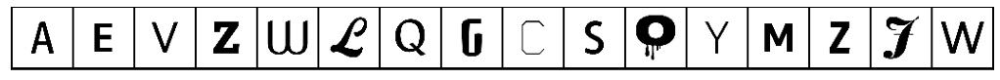

In [8]:
for images, labels in data_loader:
    fig, ax = plt.subplots(figsize=(18,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

In [9]:
def onehot_encode(label, n_class=26):  
    # ラベルをOne-Hoe形式に変換
    eye = torch.eye(n_class).to(device)
    # ランダムベクトルあるいは画像と連結するために(B, c_class, 1, 1)のTensorにして戻す
    return eye[label].view(-1, n_class, 1, 1)
def concat_image_label(image, label, n_class=26):
    # 画像とラベルを連結する
    oh_label = onehot_encode(label).to(device)       # ラベルをOne-Hot形式に変換
    oh_label = oh_label.expand(16, n_class, 64, 64)  # ラベルを画像サイズに拡大
    return torch.cat((image, oh_label), dim=1)    # 画像とラベルをチャネル方向（dim=1）で連結
 
def concat_noise_label(noise, label):
    # ランダムベクトルとラベルを連結する
    oh_label = onehot_encode(label).to(device)     # ラベルをOne-Hot形式に変換
    return torch.cat((noise, oh_label), dim=1)  # ランダムベクトルとラベルを連結

## - Generator

In [10]:
class Generator(nn.Module):
    def __init__(self, generator_layer_size, z_size, img_size, class_num):
        super().__init__()
        
        self.z_size = z_size
        self.img_size = img_size
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(self.z_size + 26, ngf * 32, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 32),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 32, ngf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 1, 3, 1, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, z, labels):

        x = concat_noise_label(z, labels)

        # Generator out
        out = self.model(x)
        
        return out

## - Discriminator

In [11]:
class Discriminator(nn.Module):
    def __init__(self, discriminator_layer_size, img_size, class_num):
        super().__init__()
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        self.img_size = img_size
        
        self.model = nn.Sequential(
            nn.Conv2d(27, ndf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, ndf * 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 8, 1, 0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x, labels):
        
        x = concat_image_label(x, labels)
        
        # Discriminator out
        out = self.model(x)
        
        return out.squeeze()

In [12]:
# Define generator
generator = Generator(generator_layer_size, z_size, img_size, class_num).to(device)
# Define discriminator
discriminator = Discriminator(discriminator_layer_size, img_size, class_num).to(device)

In [13]:
class rNet(nn.Module):
    def __init__(self):
        super(rNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        return x

model_list = []
for i in range(26):
    pretrained_model = "../GoogleFonts_reg/model/reg_" + chr(i + 65) + ".pth"
    # ネットワークの初期化
    rmodel = rNet().to(device)
    # 訓練済みモデルのロード
    rmodel.load_state_dict(torch.load(pretrained_model, map_location='cpu'))
    # モデルを評価モードに設定。本チュートリアルの例では、これはドロップアウト層等を評価モードにするのに必要
    rmodel.eval()
    model_list.append(rmodel)

## - Adversarial Learning of Generator & Discriminator

In [14]:
# Loss function
criterion = nn.BCELoss()
criterion_r = nn.MSELoss()

In [15]:
# Optimizer
g_optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate_G_g)
g_optimizer_r = torch.optim.Adam(generator.parameters(), lr=learning_rate_G_r)
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate_D)

In [16]:
# class DynamicWeight:

#     def __init__(self, init_weight=0.1, L1_x=None, L1_y=None, L2_x=None, L2_y=None):
#         self.init_weight = init_weight
#         self.L1_x = L1_x
#         self.L1_y = L1_y
#         self.L2_x = L2_x
#         self.L2_y = L2_y
#         self.x_list = []
#         self.y_list = []

#     def calc_ratio(self, L1_x, L1_y, L2_x, L2_y):
#         e = math.e

#         w_x = L2_x / L1_x
#         w_y = L2_y / L1_y
        
#         e_x = e ** w_x
#         e_y = e ** w_y
        
#         r_x = e_x / (e_x + e_y)
#         r_y = e_y / (e_x + e_y)

#         return r_x, r_y

#     def __call__(self, loss_x, loss_y):
#         self.x_list.append(loss_x)
#         self.y_list.append(loss_y)

#         if self.L2_x is None:
#             self.L2_x = self.L1_x
#             self.L2_y = self.L1_y
#             self.L1_x = loss_x
#             self.L1_y = loss_y
#             return 1, self.init_weight
        
#         else:
#             r_x, r_y = self.calc_ratio(self.L1_x, self.L1_y, self.L2_x, self.L2_y)
#             self.L2_x = self.L1_x
#             self.L2_y = self.L1_y
#             self.L1_x = loss_x
#             self.L1_y = loss_y
#             return r_x, r_y

#     def plot(self):
#         return self.x_list, self.y_list

In [17]:
def generator_train_step(batch_size, discriminator, generator, g_optimizer_g, g_optimizer_r, criterion, epoch):
    
    # Init gradient
    g_optimizer_g.zero_grad()
    g_optimizer_r.zero_grad()

    # Building z
    z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

    # Building fake labels
    fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

    # Generating fake images
    fake_images = generator(z, fake_labels)

    # Disciminating fake images
    validity = discriminator(fake_images, fake_labels)

    # Calculating discrimination loss (fake images)
    g_loss = criterion(validity, Variable(torch.ones(batch_size)).to(device))

    r_l = 0
    # for index, fale_label in enumerate(fake_labels):
    #     fake_image = fake_images[index].view(1, 1, 64, 64)
    #     output = model_list[fale_label](fake_image)
    #     r_l += criterion_r(output, torch.Tensor([[0]]).to(device))
    # r_loss = 1 / (r_l / batch_size)

    for index, fake_label in enumerate(fake_labels):
        fake_image = fake_images[index].view(1, 1, 64, 64)
        output = model_list[fake_label](fake_image)
        output_value = output.item() 
        if output_value > 25:
            output = output * 0 + 25
        r_l += (25 - output) ** 2
    r_loss = r_l / batch_size

    if (epoch % 5 == 3) or (epoch % 5 == 4):
        loss = g_loss
        # Backword propagation
        loss.backward()

        #  Optimizing generator
        g_optimizer_g.step()

        return loss.data.cpu(), g_loss.data.cpu(), r_loss.data.squeeze().squeeze().cpu()
        
    else:
        loss = r_loss
           # Backword propagation
        loss.backward()

        #  Optimizing generator
        g_optimizer_r.step()

        return loss.squeeze().squeeze().data.cpu(), g_loss.data.cpu(), r_loss.squeeze().squeeze().data.cpu()

In [18]:
def discriminator_train_step(batch_size, discriminator, generator, d_optimizer, criterion, real_images, labels):
  # Init gradient 
  d_optimizer.zero_grad()

  # Disciminating real images
  real_validity = discriminator(real_images, labels)

  # Calculating discrimination loss (real images)
  real_loss = criterion(real_validity, Variable(torch.ones(batch_size)).to(device))

  # Building z
  z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

  # Building fake labels
  fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

  # Generating fake images
  fake_images = generator(z, fake_labels)

  # Disciminating fake images
  fake_validity = discriminator(fake_images, fake_labels)

  # Calculating discrimination loss (fake images)
  fake_loss = criterion(fake_validity, Variable(torch.zeros(batch_size)).to(device))

  # Sum two losses
  loss = real_loss + fake_loss

  # Backword propagation
  loss.backward()

  # Optimizing discriminator
  d_optimizer.step()

  return loss.data.cpu()

Starting epoch 1...


100%|██████████| 4116/4116 [07:03<00:00,  9.73it/s]


G_loss: 51.139503479003906, D_loss: 0.012728176079690456, g_loss: 12.327327728271484, r_loss: 51.139503479003906


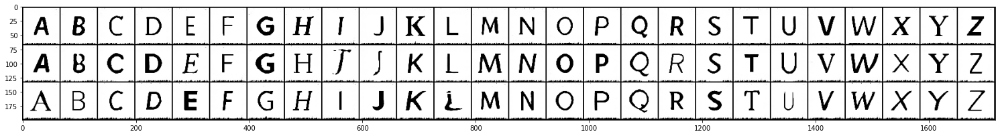

Starting epoch 2...


100%|██████████| 4116/4116 [06:35<00:00, 10.41it/s]


G_loss: 27.36313247680664, D_loss: 7.981376984389499e-05, g_loss: 18.267837524414062, r_loss: 27.36313247680664


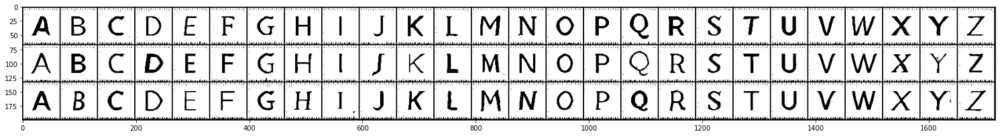

Starting epoch 3...


100%|██████████| 4116/4116 [06:42<00:00, 10.23it/s]


G_loss: 17.44352912902832, D_loss: 3.8712207128810405e-07, g_loss: 26.978130340576172, r_loss: 17.44352912902832


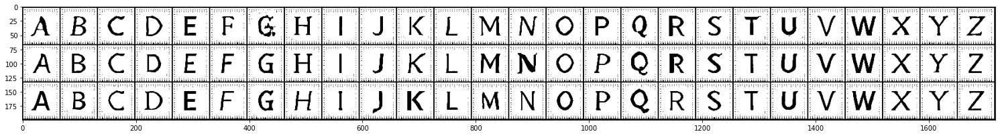

Starting epoch 4...


100%|██████████| 4116/4116 [05:20<00:00, 12.84it/s]


G_loss: 8.552068710327148, D_loss: 0.09483417123556137, g_loss: 8.552068710327148, r_loss: 66.19265747070312


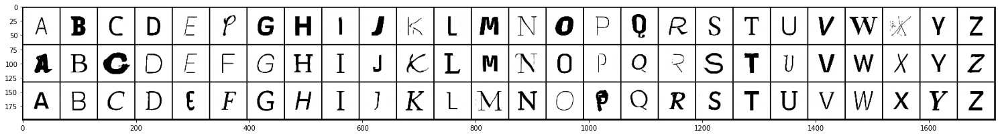

Starting epoch 5...


100%|██████████| 4116/4116 [05:18<00:00, 12.94it/s]


G_loss: 7.0024847984313965, D_loss: 0.08745258301496506, g_loss: 7.0024847984313965, r_loss: 73.79483795166016


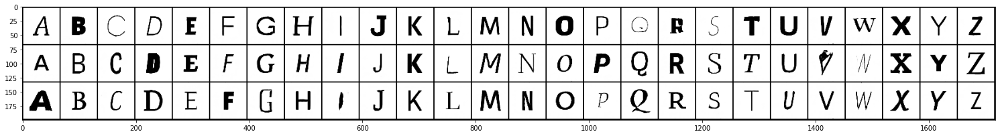

Starting epoch 6...


100%|██████████| 4116/4116 [06:33<00:00, 10.47it/s]


G_loss: 43.15485382080078, D_loss: 0.008590982295572758, g_loss: 13.415755271911621, r_loss: 43.15485382080078


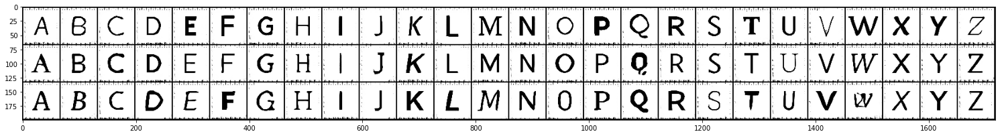

Starting epoch 7...


100%|██████████| 4116/4116 [06:29<00:00, 10.56it/s]


G_loss: 21.61179542541504, D_loss: 3.213689296899247e-06, g_loss: 19.68851089477539, r_loss: 21.61179542541504


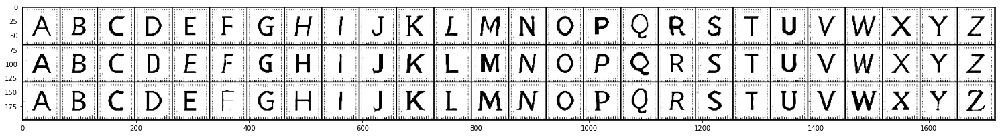

Starting epoch 8...


100%|██████████| 4116/4116 [06:33<00:00, 10.46it/s]


G_loss: 14.243182182312012, D_loss: 3.7785798667755444e-07, g_loss: 19.677539825439453, r_loss: 14.243182182312012


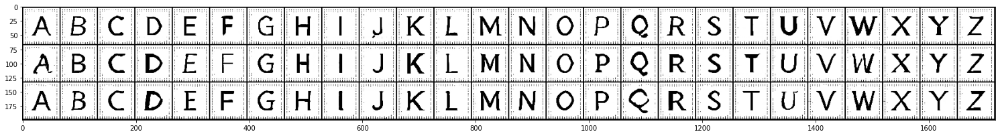

Starting epoch 9...


100%|██████████| 4116/4116 [05:17<00:00, 12.95it/s]


G_loss: 8.683880805969238, D_loss: 0.09731585532426834, g_loss: 8.683880805969238, r_loss: 54.50514221191406


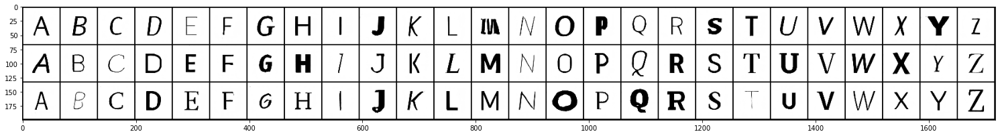

Starting epoch 10...


100%|██████████| 4116/4116 [05:23<00:00, 12.74it/s]


G_loss: 7.000622272491455, D_loss: 0.07633550465106964, g_loss: 7.000622272491455, r_loss: 69.04524993896484


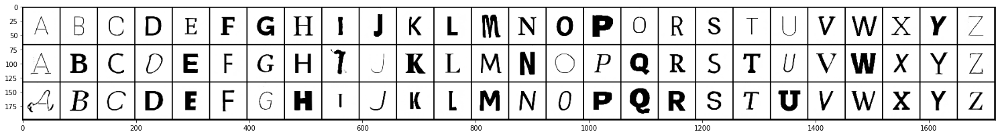

Starting epoch 11...


100%|██████████| 4116/4116 [06:36<00:00, 10.39it/s]


G_loss: 40.791690826416016, D_loss: 0.0062021128833293915, g_loss: 13.445832252502441, r_loss: 40.791690826416016


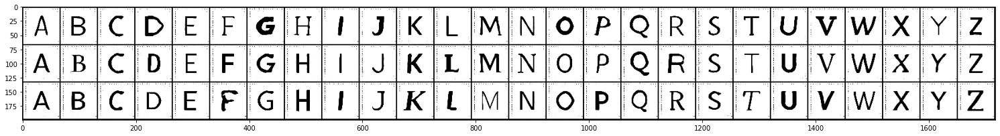

Starting epoch 12...


100%|██████████| 4116/4116 [06:44<00:00, 10.18it/s]


G_loss: 20.2755184173584, D_loss: 2.4452344860037556e-07, g_loss: 19.45353889465332, r_loss: 20.2755184173584


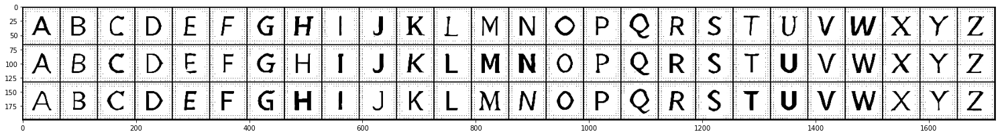

Starting epoch 13...


100%|██████████| 4116/4116 [06:40<00:00, 10.27it/s]


G_loss: 13.641159057617188, D_loss: 1.4517593172058696e-07, g_loss: 19.107149124145508, r_loss: 13.641159057617188


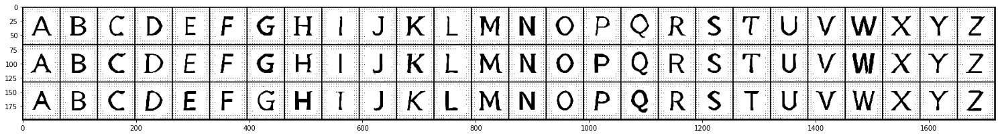

Starting epoch 14...


100%|██████████| 4116/4116 [05:15<00:00, 13.06it/s]


G_loss: 8.565335273742676, D_loss: 0.10784386843442917, g_loss: 8.565335273742676, r_loss: 60.38095474243164


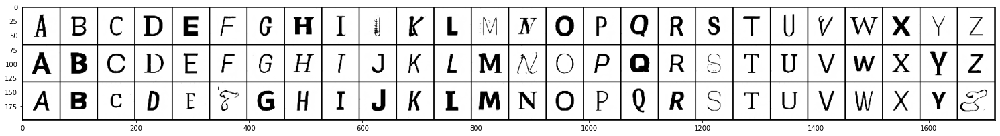

Starting epoch 15...


100%|██████████| 4116/4116 [05:13<00:00, 13.14it/s]


G_loss: 6.971765995025635, D_loss: 0.08376025408506393, g_loss: 6.971765995025635, r_loss: 75.3807601928711


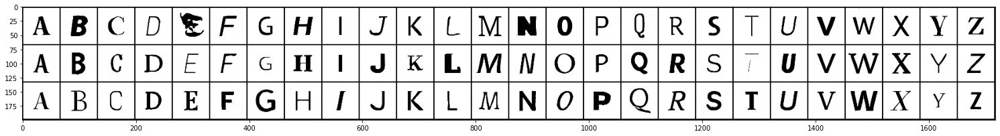

Starting epoch 16...


100%|██████████| 4116/4116 [06:43<00:00, 10.20it/s]


G_loss: 40.47743225097656, D_loss: 0.006842466536909342, g_loss: 14.822128295898438, r_loss: 40.47743225097656


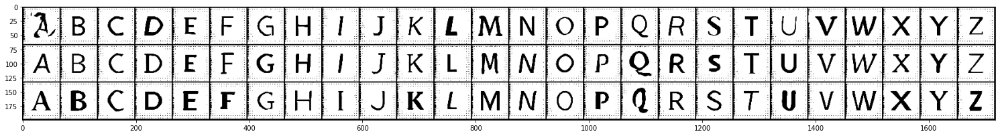

Starting epoch 17...


100%|██████████| 4116/4116 [07:22<00:00,  9.31it/s]


G_loss: 18.755271911621094, D_loss: 4.732711659016786e-06, g_loss: 20.752294540405273, r_loss: 18.755271911621094


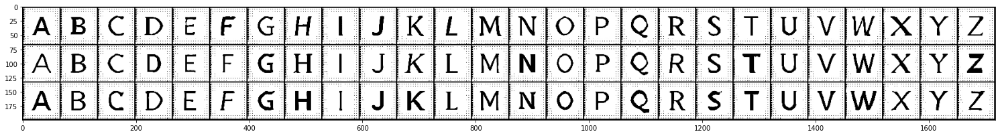

Starting epoch 18...


100%|██████████| 4116/4116 [06:36<00:00, 10.38it/s]


G_loss: 12.888022422790527, D_loss: 2.60017458231232e-07, g_loss: 21.169729232788086, r_loss: 12.888022422790527


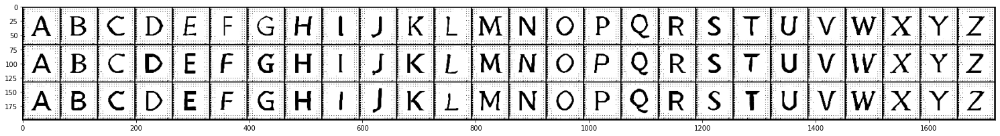

Starting epoch 19...


100%|██████████| 4116/4116 [05:24<00:00, 12.70it/s]


G_loss: 16.046655654907227, D_loss: 0.03247997909784317, g_loss: 16.046655654907227, r_loss: 122.65422058105469


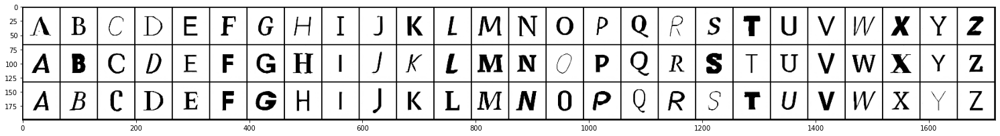

Starting epoch 20...


100%|██████████| 4116/4116 [05:22<00:00, 12.78it/s]


G_loss: 7.131481647491455, D_loss: 0.08813458681106567, g_loss: 7.131481647491455, r_loss: 66.56535339355469


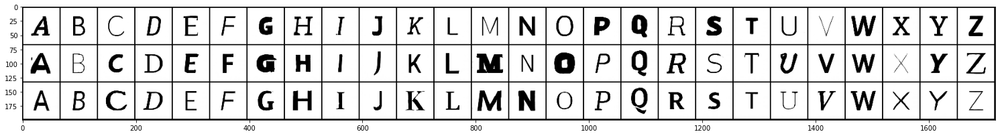

Starting epoch 21...


100%|██████████| 4116/4116 [06:39<00:00, 10.30it/s]


G_loss: 37.22676467895508, D_loss: 0.0056990403681993484, g_loss: 14.441362380981445, r_loss: 37.22676467895508


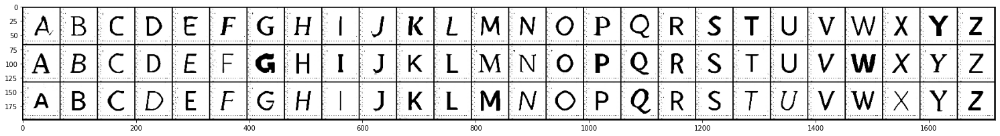

Starting epoch 22...


100%|██████████| 4116/4116 [06:40<00:00, 10.28it/s]


G_loss: 17.763938903808594, D_loss: 6.407075829883979e-07, g_loss: 23.80830192565918, r_loss: 17.763938903808594


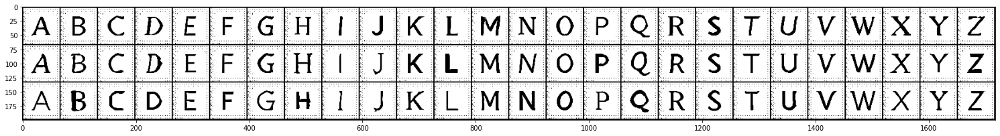

Starting epoch 23...


100%|██████████| 4116/4116 [06:42<00:00, 10.23it/s]


G_loss: 11.94898509979248, D_loss: 1.242223959252442e-07, g_loss: 25.376115798950195, r_loss: 11.94898509979248


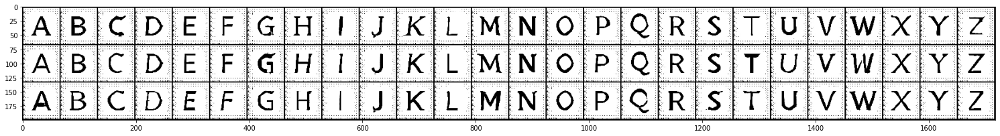

Starting epoch 24...


100%|██████████| 4116/4116 [05:35<00:00, 12.27it/s]


G_loss: 10.638815879821777, D_loss: 0.05606319010257721, g_loss: 10.638815879821777, r_loss: 47.181278228759766


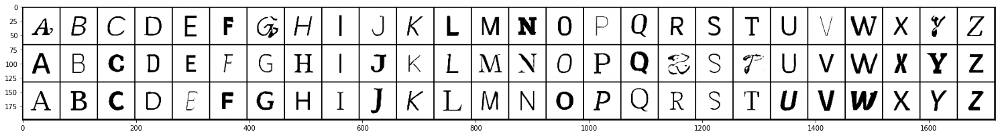

Starting epoch 25...


100%|██████████| 4116/4116 [05:13<00:00, 13.11it/s]


G_loss: 7.167299747467041, D_loss: 0.08262938261032104, g_loss: 7.167299747467041, r_loss: 71.88642120361328


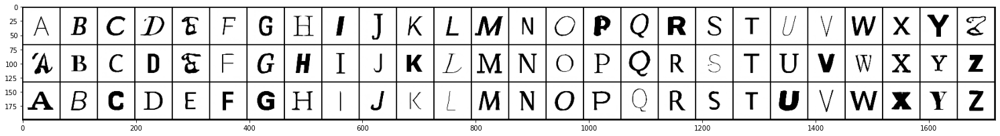

Starting epoch 26...


100%|██████████| 4116/4116 [06:41<00:00, 10.25it/s]


G_loss: 39.146949768066406, D_loss: 0.004711317829787731, g_loss: 14.000998497009277, r_loss: 39.146949768066406


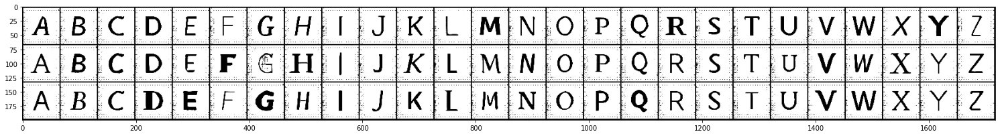

Starting epoch 27...


100%|██████████| 4116/4116 [06:40<00:00, 10.28it/s]


G_loss: 17.464570999145508, D_loss: 2.1160640244488604e-06, g_loss: 21.369144439697266, r_loss: 17.464570999145508


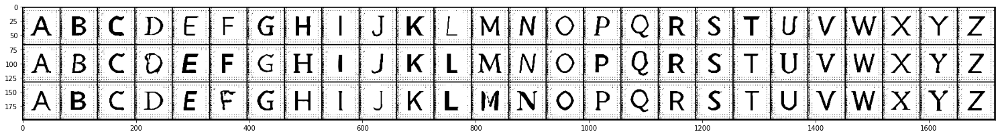

Starting epoch 28...


100%|██████████| 4116/4116 [06:38<00:00, 10.33it/s]


G_loss: 11.88657283782959, D_loss: 2.4701131451365654e-07, g_loss: 23.47922706604004, r_loss: 11.88657283782959


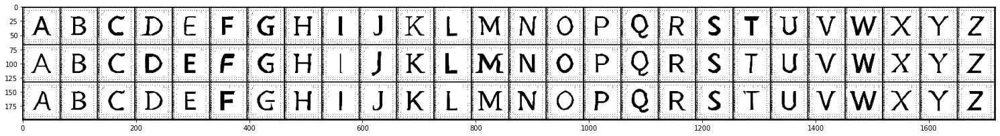

Starting epoch 29...


100%|██████████| 4116/4116 [05:16<00:00, 13.01it/s]


G_loss: 9.010016441345215, D_loss: 0.07963640987873077, g_loss: 9.010016441345215, r_loss: 57.97444152832031


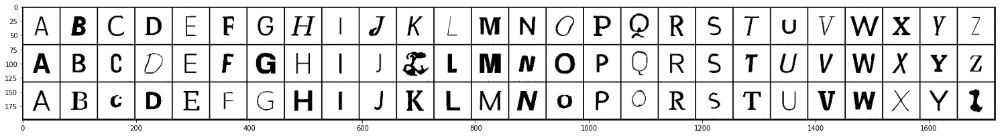

Starting epoch 30...


100%|██████████| 4116/4116 [05:21<00:00, 12.82it/s]


G_loss: 7.160462379455566, D_loss: 0.08854073286056519, g_loss: 7.160462379455566, r_loss: 76.7113265991211


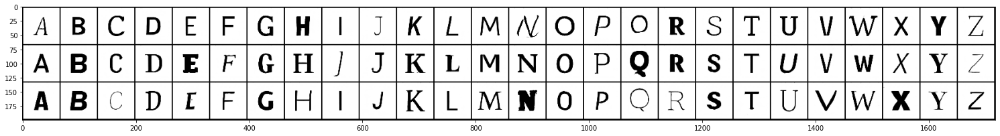

Starting epoch 31...


100%|██████████| 4116/4116 [06:38<00:00, 10.34it/s]


G_loss: 37.90061950683594, D_loss: 0.0051523237489163876, g_loss: 16.72065544128418, r_loss: 37.90061950683594


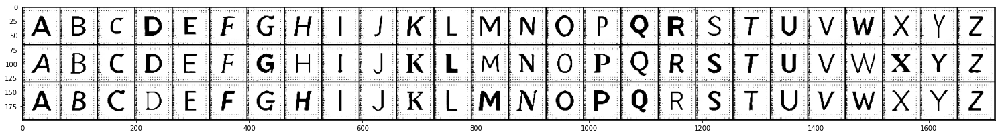

Starting epoch 32...


100%|██████████| 4116/4116 [06:28<00:00, 10.59it/s]


G_loss: 16.677522659301758, D_loss: 4.271823073054293e-08, g_loss: 24.627273559570312, r_loss: 16.677522659301758


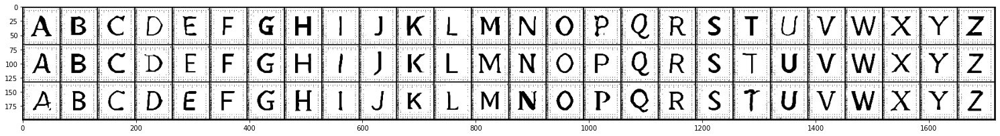

Starting epoch 33...


100%|██████████| 4116/4116 [06:40<00:00, 10.28it/s]


G_loss: 11.377948760986328, D_loss: 2.8260215501063612e-08, g_loss: 27.17870330810547, r_loss: 11.377948760986328


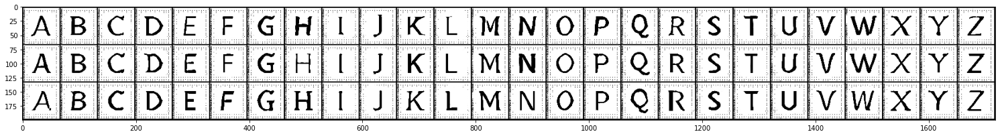

Starting epoch 34...


100%|██████████| 4116/4116 [05:33<00:00, 12.35it/s]


G_loss: 8.248018264770508, D_loss: 0.09188412874937057, g_loss: 8.248018264770508, r_loss: 60.34394836425781


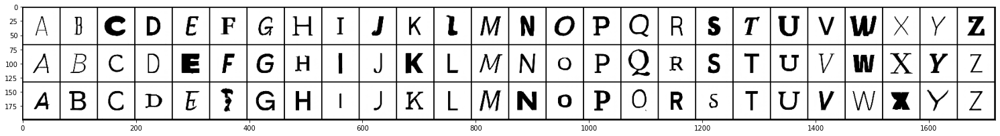

Starting epoch 35...


100%|██████████| 4116/4116 [05:25<00:00, 12.64it/s]


G_loss: 7.285048007965088, D_loss: 0.06785011291503906, g_loss: 7.285048007965088, r_loss: 76.19591522216797


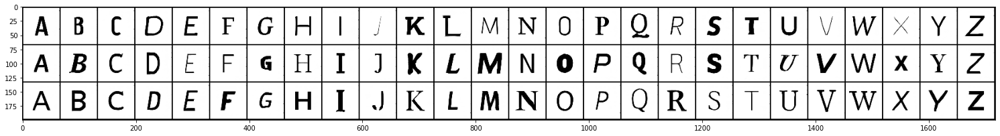

Starting epoch 36...


100%|██████████| 4116/4116 [06:36<00:00, 10.37it/s]


G_loss: 36.514347076416016, D_loss: 0.002668865257874131, g_loss: 18.045379638671875, r_loss: 36.514347076416016


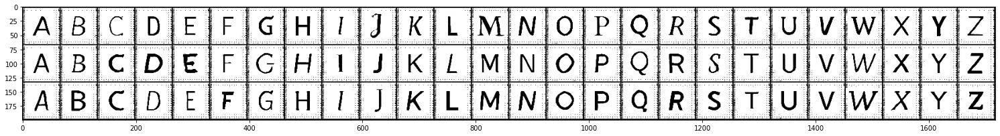

Starting epoch 37...


100%|██████████| 4116/4116 [06:35<00:00, 10.40it/s]


G_loss: 15.861207008361816, D_loss: 2.5832191568042617e-06, g_loss: 25.12340545654297, r_loss: 15.861207008361816


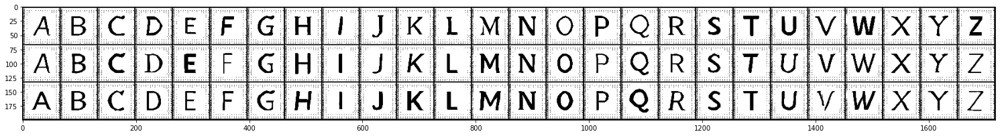

Starting epoch 38...


100%|██████████| 4116/4116 [06:48<00:00, 10.07it/s]


G_loss: 10.826543807983398, D_loss: 4.759815226407227e-07, g_loss: 25.09421730041504, r_loss: 10.826543807983398


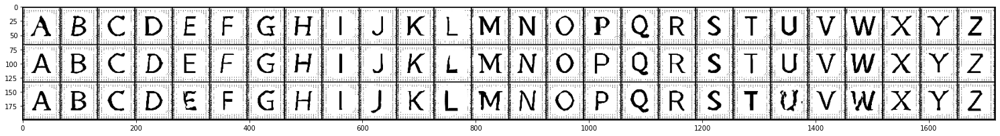

Starting epoch 39...


100%|██████████| 4116/4116 [05:20<00:00, 12.85it/s]


G_loss: 9.689284324645996, D_loss: 0.08541256189346313, g_loss: 9.689284324645996, r_loss: 57.61325454711914


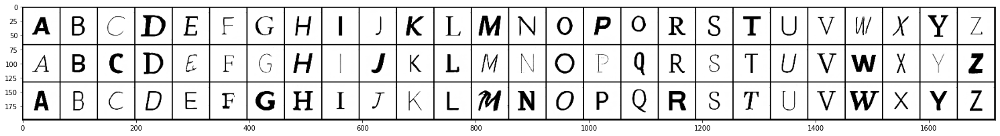

Starting epoch 40...


100%|██████████| 4116/4116 [05:12<00:00, 13.15it/s]


G_loss: 7.307191848754883, D_loss: 0.0659165009856224, g_loss: 7.307191848754883, r_loss: 73.32585906982422


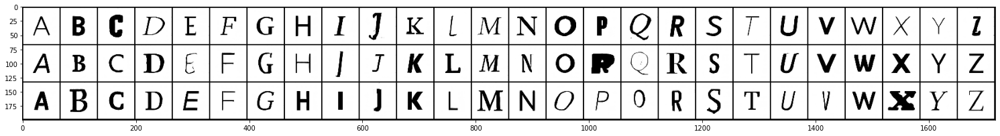

Starting epoch 41...


100%|██████████| 4116/4116 [06:44<00:00, 10.17it/s]


G_loss: 40.46981430053711, D_loss: 0.006346144713461399, g_loss: 14.656993865966797, r_loss: 40.46981430053711


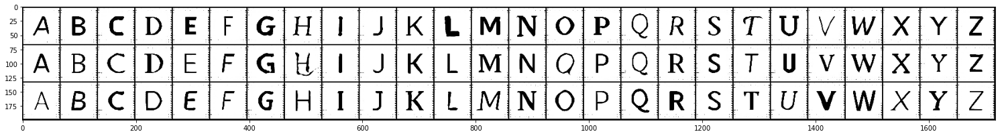

Starting epoch 42...


100%|██████████| 4116/4116 [06:33<00:00, 10.46it/s]


G_loss: 16.4805908203125, D_loss: 6.908384420967195e-06, g_loss: 23.90471076965332, r_loss: 16.4805908203125


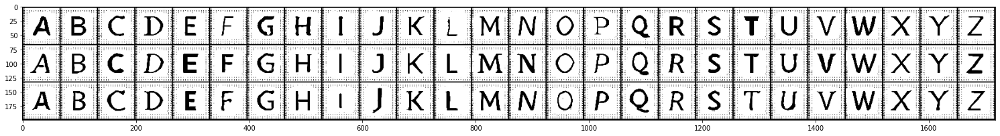

Starting epoch 43...


100%|██████████| 4116/4116 [06:41<00:00, 10.24it/s]


G_loss: 10.64222526550293, D_loss: 3.517843651934527e-07, g_loss: 24.628742218017578, r_loss: 10.64222526550293


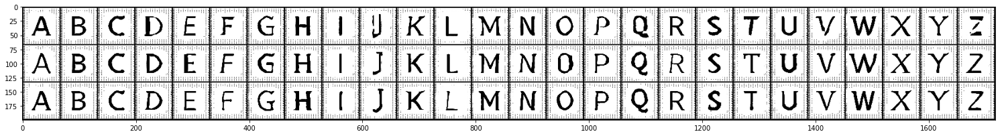

Starting epoch 44...


100%|██████████| 4116/4116 [05:45<00:00, 11.90it/s]


G_loss: 11.066689491271973, D_loss: 0.05549291893839836, g_loss: 11.066689491271973, r_loss: 57.91914749145508


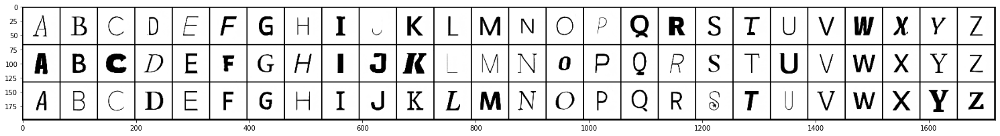

Starting epoch 45...


100%|██████████| 4116/4116 [05:13<00:00, 13.12it/s]


G_loss: 7.072675704956055, D_loss: 0.08209424465894699, g_loss: 7.072675704956055, r_loss: 74.41486358642578


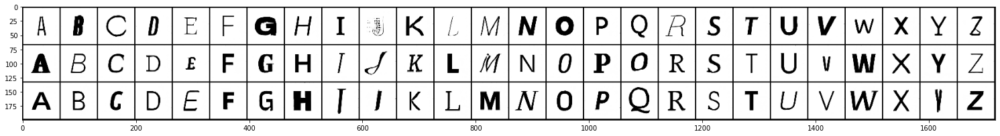

Starting epoch 46...


100%|██████████| 4116/4116 [06:32<00:00, 10.48it/s]


G_loss: 41.78585433959961, D_loss: 0.003668000688776374, g_loss: 16.986982345581055, r_loss: 41.78585433959961


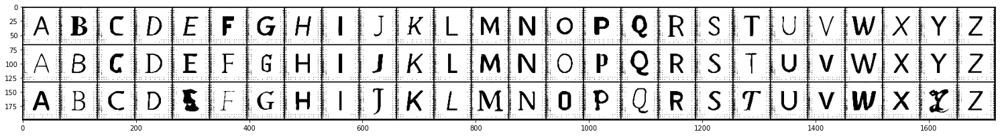

Starting epoch 47...


100%|██████████| 4116/4116 [06:38<00:00, 10.33it/s]


G_loss: 16.944381713867188, D_loss: 1.6875256960702245e-06, g_loss: 29.263917922973633, r_loss: 16.944381713867188


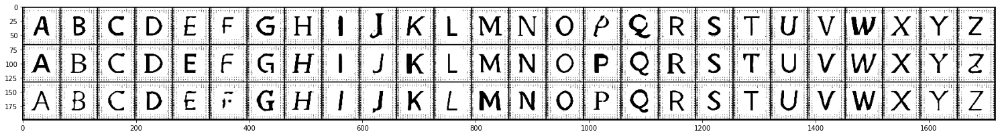

Starting epoch 48...


100%|██████████| 4116/4116 [07:33<00:00,  9.07it/s]


G_loss: 10.716206550598145, D_loss: 3.3298894663857936e-07, g_loss: 30.01156997680664, r_loss: 10.716206550598145


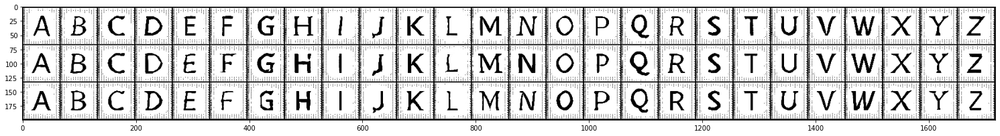

Starting epoch 49...


100%|██████████| 4116/4116 [05:12<00:00, 13.16it/s]


G_loss: 16.917835235595703, D_loss: 0.048006340861320496, g_loss: 16.917835235595703, r_loss: 50.90503692626953


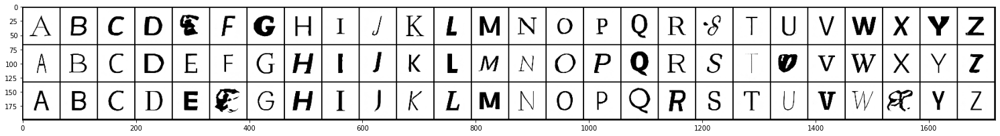

Starting epoch 50...


100%|██████████| 4116/4116 [06:09<00:00, 11.15it/s]


G_loss: 7.4154229164123535, D_loss: 0.075809545814991, g_loss: 7.4154229164123535, r_loss: 72.46591186523438


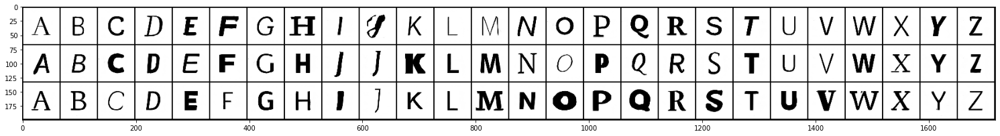

Starting epoch 51...


100%|██████████| 4116/4116 [08:26<00:00,  8.12it/s]


G_loss: 36.44114303588867, D_loss: 0.005823402665555477, g_loss: 15.943224906921387, r_loss: 36.44114303588867


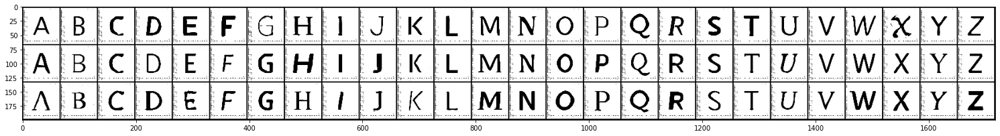

Starting epoch 52...


100%|██████████| 4116/4116 [06:36<00:00, 10.37it/s]


G_loss: 16.273406982421875, D_loss: 3.4836659779102774e-06, g_loss: 27.494125366210938, r_loss: 16.273406982421875


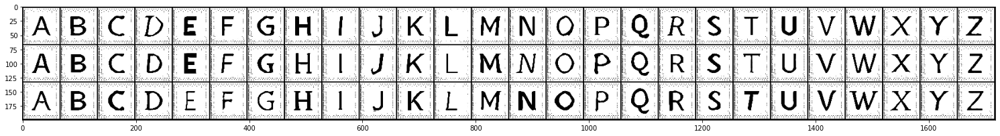

Starting epoch 53...


100%|██████████| 4116/4116 [06:33<00:00, 10.47it/s]


G_loss: 10.522784233093262, D_loss: 3.288662355771521e-07, g_loss: 30.1113224029541, r_loss: 10.522784233093262


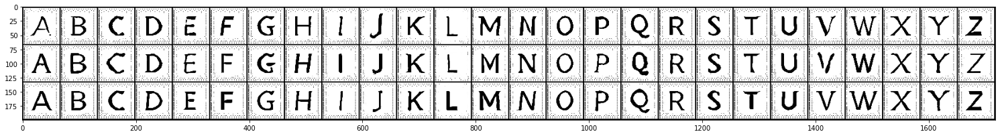

Starting epoch 54...


100%|██████████| 4116/4116 [05:31<00:00, 12.41it/s]


G_loss: 12.492979049682617, D_loss: 0.05272237956523895, g_loss: 12.492979049682617, r_loss: 75.3655776977539


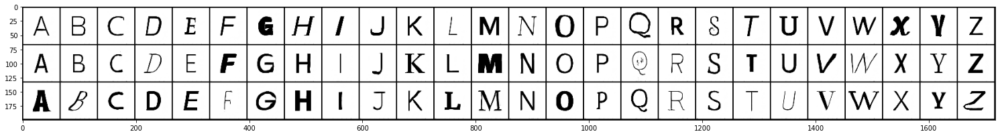

Starting epoch 55...


100%|██████████| 4116/4116 [05:23<00:00, 12.74it/s]


G_loss: 7.525769233703613, D_loss: 0.0686798021197319, g_loss: 7.525769233703613, r_loss: 75.40377807617188


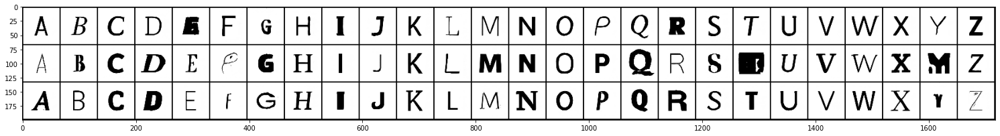

Starting epoch 56...


100%|██████████| 4116/4116 [06:42<00:00, 10.22it/s]


G_loss: 39.17826843261719, D_loss: 0.00531338294968009, g_loss: 13.650849342346191, r_loss: 39.17826843261719


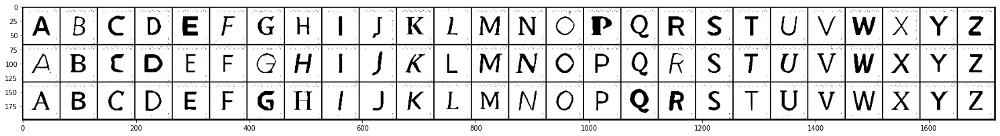

Starting epoch 57...


100%|██████████| 4116/4116 [06:31<00:00, 10.51it/s]


G_loss: 16.562461853027344, D_loss: 4.629231170838466e-06, g_loss: 30.104225158691406, r_loss: 16.562461853027344


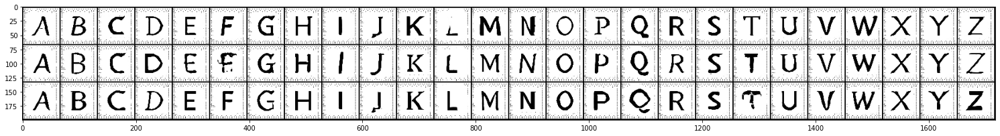

Starting epoch 58...


100%|██████████| 4116/4116 [06:36<00:00, 10.37it/s]


G_loss: 10.265851020812988, D_loss: 1.5992780433293774e-09, g_loss: 29.871883392333984, r_loss: 10.265851020812988


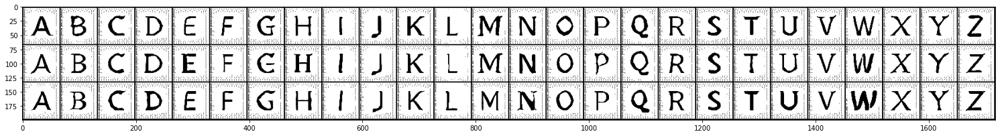

Starting epoch 59...


100%|██████████| 4116/4116 [06:00<00:00, 11.43it/s]


G_loss: 41.10448455810547, D_loss: 4.305638412915869e-06, g_loss: 41.10448455810547, r_loss: 191.3766632080078


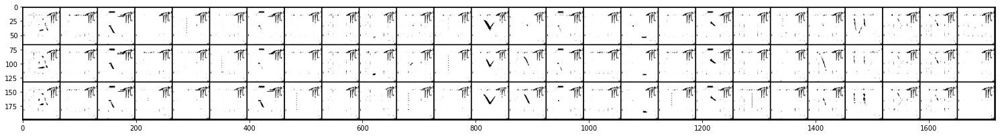

Starting epoch 60...


100%|██████████| 4116/4116 [05:23<00:00, 12.73it/s]


G_loss: 54.43556213378906, D_loss: 4.834943556630833e-09, g_loss: 54.43556213378906, r_loss: 218.40078735351562


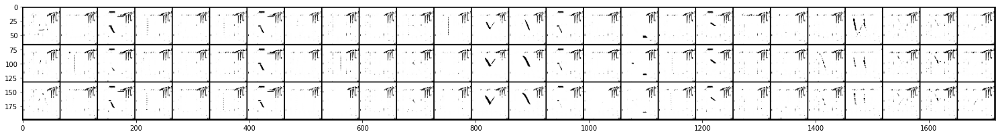

Starting epoch 61...


100%|██████████| 4116/4116 [06:51<00:00, 10.00it/s]


G_loss: 20.37999725341797, D_loss: 1.1032994517989891e-09, g_loss: 33.86662292480469, r_loss: 20.37999725341797


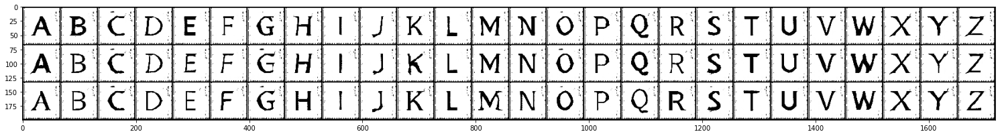

Starting epoch 62...


100%|██████████| 4116/4116 [06:49<00:00, 10.04it/s]


G_loss: 9.578278541564941, D_loss: 1.8644585875193798e-10, g_loss: 28.969863891601562, r_loss: 9.578278541564941


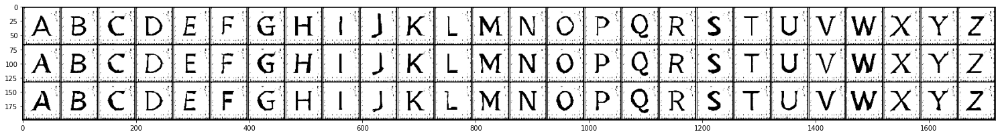

Starting epoch 63...


100%|██████████| 4116/4116 [06:41<00:00, 10.24it/s]


G_loss: 7.725840091705322, D_loss: 2.1721813583952532e-11, g_loss: 30.842166900634766, r_loss: 7.725840091705322


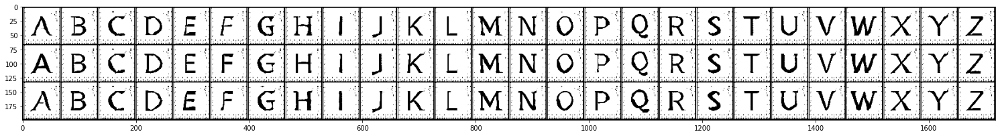

Starting epoch 64...


100%|██████████| 4116/4116 [05:29<00:00, 12.49it/s]


G_loss: 10.892849922180176, D_loss: 0.04823439568281174, g_loss: 10.892849922180176, r_loss: 65.44374084472656


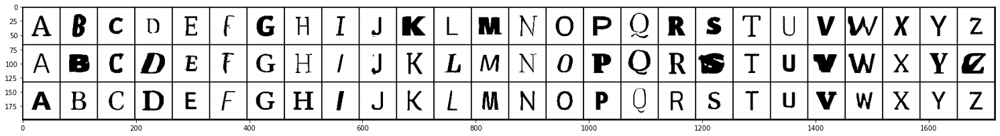

Starting epoch 65...


100%|██████████| 4116/4116 [05:33<00:00, 12.33it/s]


G_loss: 7.826435565948486, D_loss: 0.06165050342679024, g_loss: 7.826435565948486, r_loss: 72.33104705810547


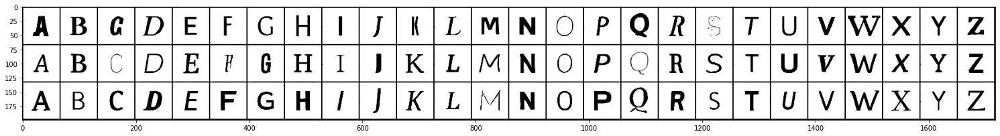

Starting epoch 66...


100%|██████████| 4116/4116 [06:48<00:00, 10.07it/s]


G_loss: 33.5476188659668, D_loss: 0.008508512750267982, g_loss: 17.798583984375, r_loss: 33.5476188659668


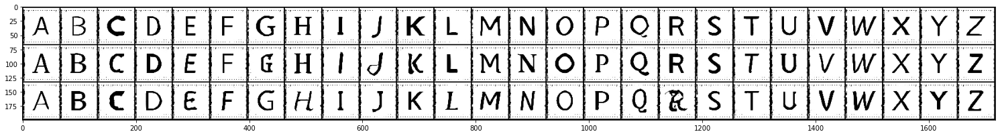

Starting epoch 67...


100%|██████████| 4116/4116 [06:50<00:00, 10.02it/s]


G_loss: 14.161876678466797, D_loss: 2.2530150545208016e-06, g_loss: 30.360994338989258, r_loss: 14.161876678466797


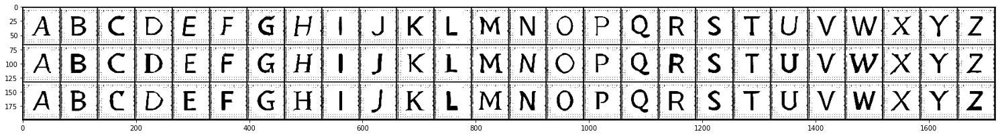

Starting epoch 68...


100%|██████████| 4116/4116 [06:54<00:00,  9.94it/s]


G_loss: 9.764959335327148, D_loss: 1.1037143821113204e-07, g_loss: 35.026893615722656, r_loss: 9.764959335327148


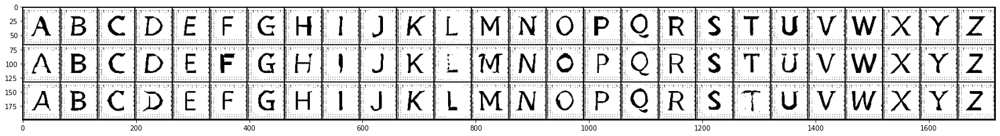

Starting epoch 69...


100%|██████████| 4116/4116 [05:39<00:00, 12.12it/s]


G_loss: 11.177875518798828, D_loss: 0.08191192150115967, g_loss: 11.177875518798828, r_loss: 54.05314254760742


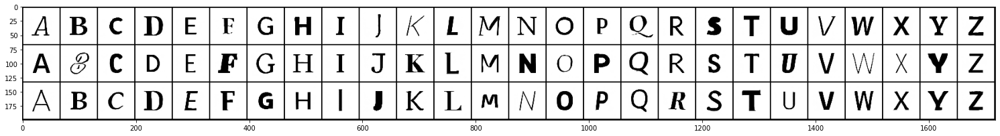

Starting epoch 70...


100%|██████████| 4116/4116 [05:35<00:00, 12.25it/s]


G_loss: 7.51948881149292, D_loss: 0.06978092342615128, g_loss: 7.51948881149292, r_loss: 73.7011489868164


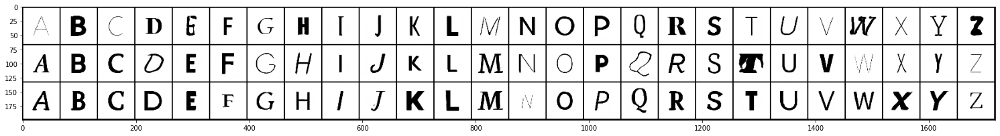

Starting epoch 71...


100%|██████████| 4116/4116 [06:57<00:00,  9.86it/s]


G_loss: 34.24728012084961, D_loss: 0.00372633570805192, g_loss: 19.864173889160156, r_loss: 34.24728012084961


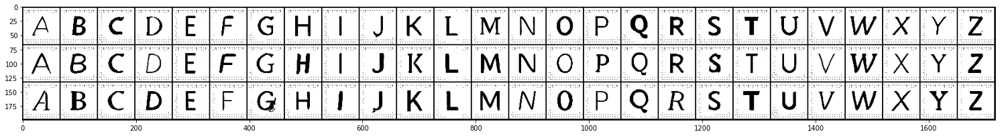

Starting epoch 72...


 75%|███████▌  | 3098/4116 [05:09<01:37, 10.41it/s]

In [19]:
history = []
generator.load_state_dict(torch.load("generator.pth", map_location='cpu'))
discriminator.load_state_dict(torch.load("discriminator.pth", map_location='cpu'))
for epoch in range(epochs):
    print('Starting epoch {}...'.format(epoch+1))
    G_losses, D_losses, g_losses, r_losses = [], [], [], []
    for images, labels in tqdm(data_loader):
        # Train data
        real_images = Variable(images).to(device)
        labels = Variable(labels).to(device)

        # Set generator train
        generator.train()

        # Train discriminator
        d_loss = discriminator_train_step(len(real_images), discriminator,
                                          generator, d_optimizer, criterion,
                                          real_images, labels)
        
        # Train generator
        G_loss, g_loss, r_loss = generator_train_step(batch_size, discriminator, generator, g_optimizer_g, g_optimizer_r, criterion, epoch)

        G_losses.append(G_loss)
        D_losses.append(d_loss)
        g_losses.append(g_loss)
        r_losses.append(r_loss)
   
    g_1_2.append(np.mean(g_losses))
    r_1_2.append(np.mean(r_losses))

    info = {
            "epoch": epoch + 1,
            "G_loss": np.mean(G_losses),
            "D_loss": np.mean(D_losses),
            "g_loss": np.mean(g_losses),
            "r_loss": np.mean(r_losses),
            }
    history.append(info)
    torch.save(generator.state_dict(), "./GAN+reg_25_g2_r3/{}.pth".format(epoch + 1))
    # Set generator eval
    generator.eval()
    print('G_loss: {}, D_loss: {}, g_loss: {}, r_loss: {}'.format(np.mean(G_losses), np.mean(D_losses), np.mean(g_losses), np.mean(r_losses)))

    z = Variable(torch.randn(3 * 26, z_size, 1, 1)).to(device)

    # Labels 0 ~ 9
    labels = Variable(torch.LongTensor([i for _ in range(3) for i in range(class_num)])).to(device)

    # Generating images
    sample_images = generator(z, labels)

    sample_images = sample_images.data.cpu()
    grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
    fig, ax = plt.subplots(figsize=(26,26))
    plt.imshow(grid)
    plt.show()

    # # Building z 
    # z = Variable(torch.randn(class_num-1, z_size, 1, 1)).to(device)
    
    # # Labels A ~ Y
    # labels = Variable(torch.LongTensor(np.arange(class_num-1))).to(device)
    
    # # Generating images
    # sample_images = generator(z, labels).data.cpu()
    
    # # Show images
    # grid = make_grid(sample_images, nrow=5, normalize=True).permute(1,2,0).numpy()
    # plt.imshow(grid)
    # plt.show()

history = pd.DataFrame(history)

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["g_loss"], label="Generator_g")
ax.plot(history["epoch"], history["r_loss"], label="Generator_r")
ax.plot(history["epoch"], history["D_loss"], label="Discriminator")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("./GAN+reg_25_g2_r3/loss_GAN+reg_notfixed_hinge25.png", facecolor="white")

NameError: name 'plt' is not defined

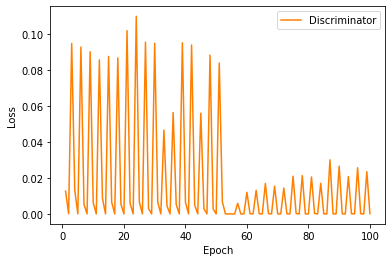

In [ ]:
plt.plot(history["epoch"], history["D_loss"], color='#ff7f00',label="Discriminator")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.savefig("./GAN+reg_25_g2_r3/D_loss_GAN+reg_notfixed_hinge25.png", facecolor="white")
plt.show()

In [ ]:
pretrained_model = "googlefonts.pth"
use_cuda = True
class cNet(nn.Module):
    def __init__(self):
        super(cNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 26)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        return output

# MNISTのTest datasetと dataloaderの定義
# test_loader = torch.utils.data.DataLoader(
#     datasets.MNIST('../data', train=False, download=True, transform=transforms.Compose([
#             transforms.ToTensor(),
#             transforms.Normalize((0.5,), (0.5,))
#             ])), 
#         batch_size=1, shuffle=False)

# 使うデバイス（CPUかGPUか）の定義
print("CUDA Available: ",torch.cuda.is_available())
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")

# ネットワークの初期化
cmodel = cNet().to(device)
print(cmodel)
# 訓練済みモデルのロード
cmodel.load_state_dict(torch.load(pretrained_model, map_location='cpu'))

CUDA Available:  True
cNet(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.25, inplace=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=57600, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=26, bias=True)
)


<All keys matched successfully>

## - Show Generating Images

22.99363452911377
500


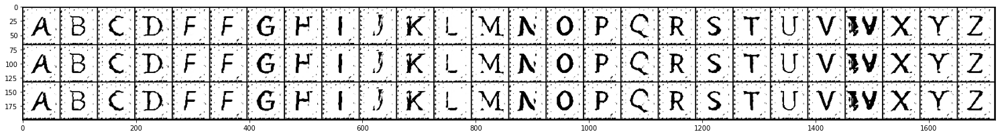

In [ ]:
z = Variable(torch.randn(26 * 26, z_size, 1, 1)).to(device)

# Labels 0 ~ 9
labels = Variable(torch.LongTensor([i for _ in range(class_num) for i in range(class_num)])).to(device)

# Generating images
sample_images = generator(z, labels)

reg_list = []
false = 0
for image, label in zip(sample_images, labels):
    image, label = image.unsqueeze(0).to(device), label.unsqueeze(0).type(torch.LongTensor).to(device)

    # データをモデルに順伝播させます
    output = cmodel(image)
    init_pred = output.max(1, keepdim=True)[1] # 最大の確率のインデックスを取得します。

    # 最初から予測が間違っている場合、攻撃する必要がないため次のイテレーションに進みます。
    
    if init_pred.item() != label.item():
        false += 1
        continue

    reg_list.append(model_list[label.item()](image).item())

    if len(reg_list) == 500:
        break

# print(reg_list)
print(np.mean(reg_list))

print(len(reg_list))

z = Variable(torch.randn(3 * 26, z_size, 1, 1)).to(device)

# Labels 0 ~ 9
labels = Variable(torch.LongTensor([i for _ in range(3) for i in range(class_num)])).to(device)

# Generating images
sample_images = generator(z, labels)

sample_images = sample_images.data.cpu()
grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
fig, ax = plt.subplots(figsize=(26,26))
plt.imshow(grid)
plt.savefig('./GAN+reg_25_g2_r3/GAN+reg_sample_notfixed_hinge25.png')